<a href="https://colab.research.google.com/github/Olamaryse/--experimental-app/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-toEnd Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow and and Tensorflow Hub.

## 1. Problem
Identifying the breed of a dog given the image of the dog.

## 2. Data
The data we are using from Kaggle's dog breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features
Some information about the data:
* We are dealing with images (unstructured data) so it is best to use deep learning/transfer learning.
* There are 120 breeds of dog (tjat means 120 different classes).
* There are around 10000+ images in the training set (labeled images).
* There are around 10000+ images in the test set (unlabeled images).


### Get our workspace ready

* Import Tensorflow 2.x
* Import Tnesorflow Hub
* Make sure we are using GPU

In [1]:
# import Tensorflow into colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.18.0


In [2]:
# Import necessary tools
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YES!!!)" if tf.config.list_physical_devices("GPU") else not "available")

TF Hub version: 0.16.1
GPU available (YES!!!)


## Getting data ready (turning into tensors)

With all machine learning models, data has to be in numeric format.



In [3]:
# Checkout tha labels of data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

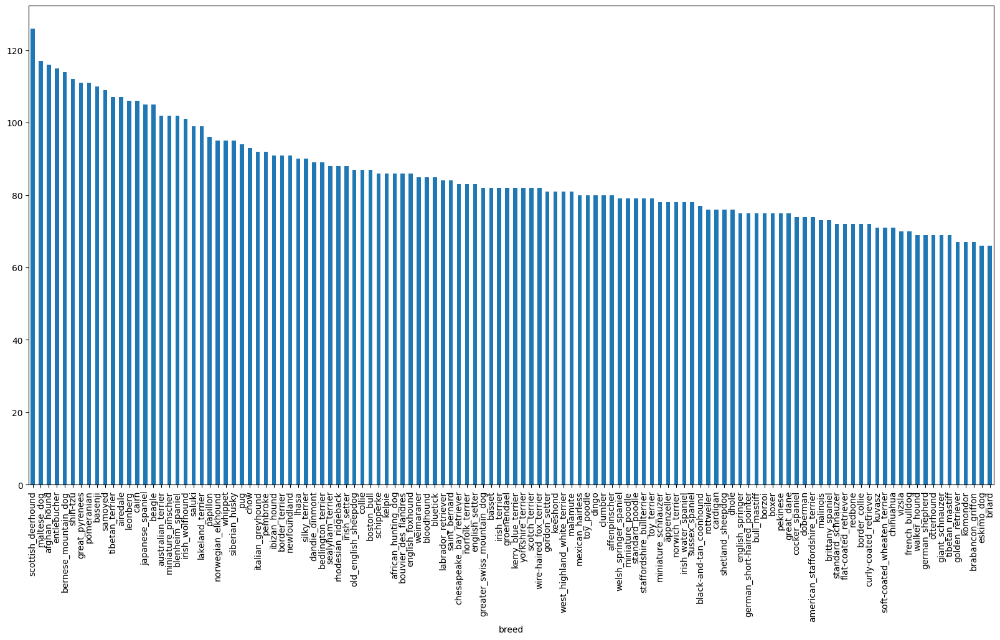

In [4]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [5]:
labels_csv['breed'].value_counts().median()

82.0

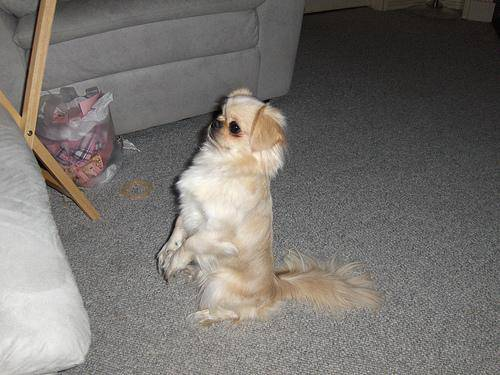

In [6]:
# View an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

### Getting images and their lables

Getting a list of imge file pathnames

In [7]:
filenames = [fname for fname in labels_csv['id']]

filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [8]:
# Create pathnames from imageIDs
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv['id']]

filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
# Check wether number of file names match number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files. Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames do not match actual amount of files, check the target directory.


In [10]:
labels_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [11]:
len(filenames)

10222

In [12]:
len(os.listdir("drive/MyDrive/Dog Vision/train"))

10272

Prepare the labels

In [13]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# Check if num of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames. Proceed.")
else:
  print("Number of labels does not match number of filenames. Check data import.")

Number of labels matches number of filenames. Proceed.


In [16]:
# Find the unique label value
unique_breed = np.unique(labels)
len(unique_breed)

120

In [17]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breed for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

In [19]:
# Example: Turning boolean array into integars
print(labels[0]) # original label
print(np.where(unique_breed == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:
(labels[2])
print(boolean_labels[2].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating my own validation set

The dataset from kaggle does not come with a validation set

In [21]:
# Setup x and y variables
x = filenames
y = boolean_labels

In [22]:
len(filenames)

10222

Start off experimenting with 1000 images annd increase as needed

In [23]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [24]:
# Split data into train and validation
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_Images
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [25]:
x_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images (Turning images to tensors)

To preprocess our images into Tensors we are going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our a`image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 t0 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [26]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [27]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [28]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [29]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [30]:
tf.image.convert_image_dtype(image, tf.float32)

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34901962, 0.5372549 , 0.34901962],
        [0.29803923, 0.48627454, 0.29803923],
        [0.24705884, 0.43529415, 0.2392157 ],
        ...,
        [0.3019608 , 0.52156866, 0.3372549 ],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29803923, 0.5254902 , 0.3372549 ]],

       [[0.28235295, 0.4666667 , 0.29411766],
        [0.2627451 , 0.44705886, 0.26666668],
        [0.24705884, 0.43137258, 0.2509804 ],
        ...,
        [0.29411766, 0.5137255 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21960786, 0.40784317, 0.25882354],
        [0.227451  , 0.4156863 , 0.26666668],
        [0.2509804 , 0.43921572, 0.2901961 ],
        ...,
        [0.2784314 , 0.49803925, 0.32156864],
        [0.28627452, 0.5058824 , 0.32941177],
        [0.2901961 , 0.50980395, 0.33333334]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

## Turning our data into batches

Why turn our data into batches

Trying to process 10,000+ images in one go? it might not fit into memory. Which is why we do 32 images batch size (You can manually adjust the bacth size if need be).

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`




In [31]:
# Create a simple funtle to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated lael processes the image and returns a type of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [32]:
# Demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Make a function to turn all of our data (x & y) into batches

In [33]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [34]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [35]:
# Check out the difference attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

In [36]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breed[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [37]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

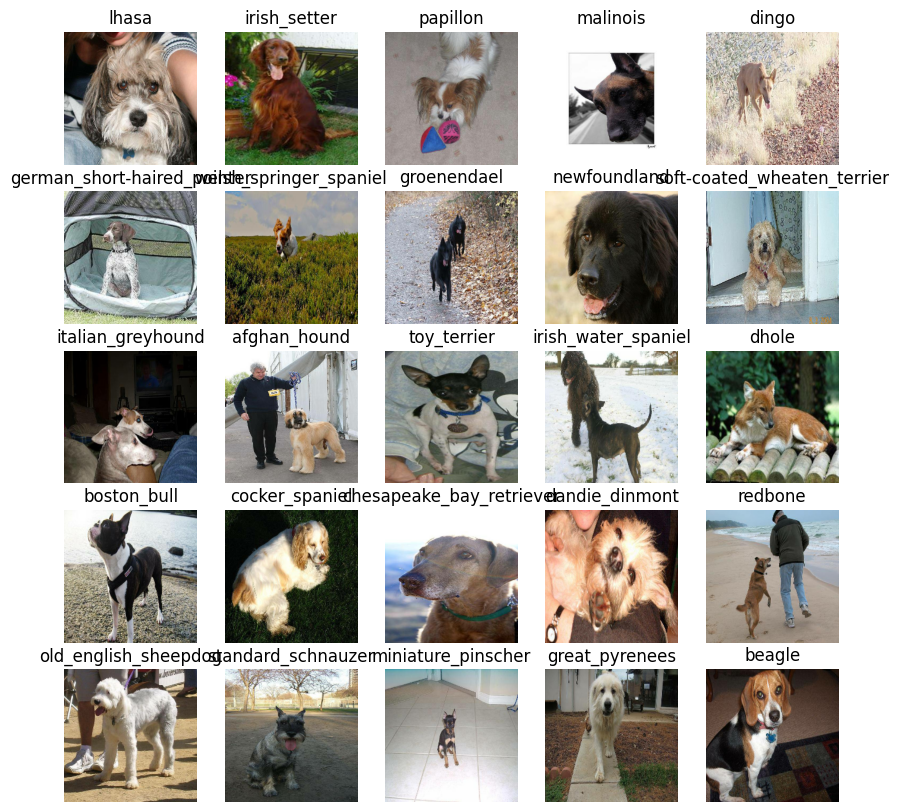

In [38]:
# Visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
# Visualise the data in training batch
show_25_images(train_images, train_labels)

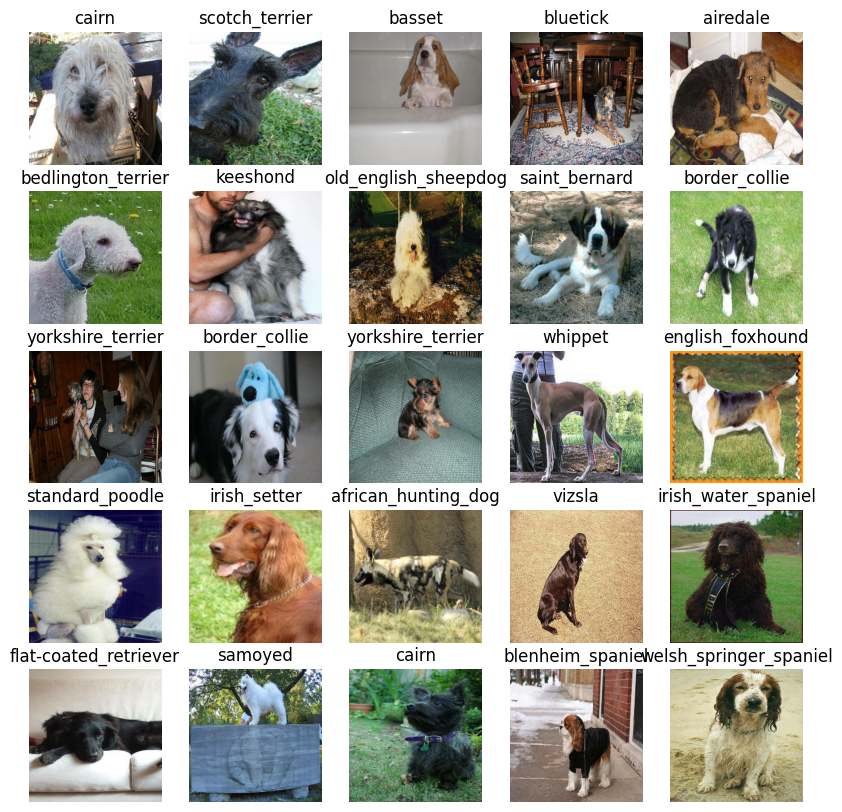

In [39]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before building a model, there are a few things to be defined:
* The input shape (image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) to our model.
* The URL of the model we want to use from tensorflow hub - "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1".

In [40]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, coluor channels

# Setup otput shape of model
OUTPUT_SHAPE = len(unique_breed)

# Setup model URL from tensorflow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Put the input and output together into a Keras deep learning model.

Create a function which:
* Takes the input shape, output shape and the model chosen as parameters.
* Defines the layer in a Keras model in sequential fashion (running from layer to layer).
* Compiles the model ( says it should be evaluated and improved).
* Builds the model (tell the model the input shape it will be getting).
* Returns the model.

All of the steps can be found at: https://www.tensorflow.org/guide/keras

In [41]:
import tf_keras as keras
from tf_keras import layers

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  input_layer = hub.KerasLayer(MODEL_URL) # Layer 1 (input layer)
  output_layer = keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)


  ## Create the sequential model with the layers.
  model = keras.Sequential([
      input_layer,
      output_layer
  ])

  # Compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model


In [42]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Create callbacks

Callbacks are helper functions a model can use during training to do such thigs as save its progress, check its progress and stop training early if a model stops improving.

Creating 2 callbacks. one for TensorBoard which helps track models progress and another for early stopping which prevents model from traing for too long.

### TensorBoard Callback

To setup a TensorBoard callback:
1. Load the tensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to directory and pass it to model's `fit()` function.
3. Visualize models training logs with the `%tensorboard` magic function.

In [43]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [44]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard log
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the log gets tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stoping callback..

Early stoping elps stop our model from overfitting by stopping if a certain evaluation metrics stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [45]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

The first model is only going to train on 1000 images, to make sure everything is working.

In [46]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

In [47]:
# Check to make sure GPU is still running
print("GPU", "available (yes)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (yes)


Let's create a function which Trains our model.

* Create a model using create_model()
* Set up a tensorBoard callback using create_tensorboard_callback().
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for('NUM_EPOCHS')
and the callbacks we will like to use.
* Return the model.

In [48]:
from tf_keras.callbacks import TensorBoard, EarlyStopping

In [49]:
# Create a tensorboard callback
tensorboard = TensorBoard(log_dir='./logs')

    # Create an EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss')

In [50]:
## Create early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                               patience=3)

## Build a function to train and return a train model.
def model_create():
  """
  Train a given and return the trained version.
  """
  ## Create a model
  model = create_model()

  ## Fit the model to the data passing it the callback we created.
  model.fit(
        train_data,
        epochs=10,
        validation_data=val_data,
        validation_freq=1,
        callbacks=[tensorboard, early_stopping])

   # Return the fitted model
  return model

In [51]:
# Fit the model to the data
model = model_create()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/10
25/25 [==============================] - 171s 7s/step - loss: 4.6161 - accuracy: 0.0787 - val_loss: 3.4117 - val_accuracy: 0.2650
Epoch 2/10
25/25 [==============================] - 4s 154ms/step - loss: 1.6456 - accuracy: 0.6812 - val_loss: 2.1179 - val_accuracy: 0.5000
Epoch 3/10
25/25 [==============================] - 4s 166ms/step - loss: 0.5660 - accuracy: 0.9375 - val_loss: 1.6404 - val_accuracy: 0.5900
Epoch 4/10
25/25 [==============================] - 4s 157ms/step - loss: 0.2564 - accuracy: 0.9887 - val_loss: 1.4777 - val_accuracy: 0.6250
Epoch 5/10
25/25 [==============================] - 4s 156ms/step - loss: 0.1492 - accuracy: 0.9975 - val_loss: 1.3801 - val_accuracy: 0.6350
Epoch 6/10
25/25 [==============================] - 5s 186ms/step - loss: 0.1011 - accuracy: 0.9987 - val_loss: 1.3344 - val_accuracy: 0.6350
Epoch 7/10
25/25 [===========================

It looks like our model is overfitting because it performing far better on the training data set than the validation dataset.
What are some ways to prevent model overfitting in deep learning neural networks?

**NOTE** Overfitting to begin with is good thing, it means our model is learning!!!

`Mary's Note` To prevent overfitting in deep learning neural networks, focus on increasing the amount and diversity of your training data, simplifying the model, and adding regularization techniques.  


## CHECKING THE TENSORBOARD LOG
The TensorBoard magic function (%tensorboard) will access the log directory we created earlier and visualize it's contents.

In [52]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluatingv Predicitions using a Trained Model

In [53]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [54]:
## Make predictions on the validation data (not use to train on)
predictions = model.predict(val_data, verbose=1) ## Verbose is just like saying 'Hey when making your predictions show me your progress'.
predictions

7/7 [==============================] - 2s 146ms/step


array([[9.84191312e-04, 1.07993910e-04, 4.60343843e-04, ...,
        5.42302208e-04, 1.39570315e-04, 2.51229573e-03],
       [4.44750441e-03, 2.19006883e-03, 1.02647431e-02, ...,
        7.70557963e-04, 1.05040353e-02, 2.39461529e-04],
       [2.09179780e-05, 7.18546507e-05, 7.94725420e-05, ...,
        6.29219983e-04, 8.24938834e-05, 4.52618377e-04],
       ...,
       [2.45882416e-06, 5.81837121e-05, 5.90351410e-05, ...,
        2.21861974e-05, 1.99244925e-04, 5.51405654e-04],
       [1.87898672e-03, 4.01418547e-05, 9.24391716e-05, ...,
        4.11509718e-05, 1.00348756e-04, 1.44120855e-02],
       [9.01987194e-04, 9.52628761e-05, 1.27353269e-04, ...,
        1.18558109e-03, 1.73808527e-04, 3.24277644e-05]], dtype=float32)

In [55]:
predictions[0]

array([9.84191312e-04, 1.07993910e-04, 4.60343843e-04, 1.69179839e-05,
       1.31358486e-03, 3.35731165e-05, 3.95799950e-02, 2.22536008e-04,
       2.69110198e-04, 9.88167245e-04, 2.60755187e-04, 1.45950180e-04,
       8.99994848e-05, 1.74542693e-05, 1.66372483e-05, 9.75391187e-04,
       3.07984825e-04, 9.92917791e-02, 1.22092562e-04, 6.62223101e-05,
       3.18032224e-04, 1.11274836e-04, 1.24988437e-04, 3.03881150e-03,
       3.18252751e-05, 1.04176659e-04, 1.45107120e-01, 2.51217699e-03,
       1.34282932e-03, 1.10323052e-03, 1.60119816e-04, 4.09209140e-04,
       6.75464398e-04, 5.55922052e-05, 1.27949787e-03, 8.12942460e-02,
       2.96210801e-05, 7.25035905e-04, 1.65347650e-04, 3.86833330e-04,
       6.24241366e-04, 8.61656445e-05, 3.76016833e-05, 1.90263076e-04,
       1.26087674e-04, 1.91789630e-04, 5.89143383e-05, 4.15479270e-04,
       2.49259756e-03, 5.88197203e-04, 1.54566587e-04, 6.33471864e-05,
       4.03219368e-03, 3.56867153e-04, 1.11825364e-04, 4.24938553e-05,
      

In [56]:
## Let's sum up all of this to see if it'll be very close to 1 or = 1.
np.sum(predictions[0])

np.float32(0.99999994)

This why will apply softmax function in code 42 line 11. As we dealing with large dataset. That is, prior to applying softmax, some vector components could be negative, or greater than one; and might not sum to 1; but after applying softmax, each component will be in the interval (0 , 1).. Remember, all that softmax is doing is taking our 1280 array of output numbers and turning or changing it into array of numbers as seen above in predictions[0] result.

In [57]:
np.sum(predictions[1])

np.float32(1.0)

In [58]:
 ## Let's make our 1st prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breed[np.argmax(predictions[index])]}")

[1.09501532e-04 9.58332967e-05 9.01369203e-05 5.93230434e-05
 5.52109024e-03 1.60657932e-04 4.46296966e-04 1.90271542e-03
 2.95944456e-02 5.34345210e-02 3.05000667e-05 7.69402322e-06
 1.36144692e-03 2.44361814e-03 5.38956141e-04 5.23328362e-03
 2.93972407e-05 1.65414778e-04 2.34489926e-04 2.68609932e-04
 9.80901896e-05 3.99486511e-04 1.83098338e-04 2.37376138e-04
 1.32860122e-02 7.16161012e-05 7.45731450e-05 1.63964476e-04
 4.28885978e-04 6.29509232e-05 3.78712750e-04 1.42044853e-04
 1.14398550e-04 2.66057523e-05 3.87998480e-05 3.66576496e-05
 1.71069885e-04 8.66047572e-04 1.81261406e-04 1.88679963e-01
 5.26020303e-05 3.79293633e-05 2.77918531e-03 8.88028444e-06
 3.64751264e-04 4.74497901e-05 1.16682219e-04 7.46169651e-04
 2.09055688e-05 1.23570295e-04 4.64806217e-05 7.32879329e-04
 4.93602594e-04 8.17882270e-03 1.04008788e-04 2.54831160e-04
 3.17119964e-04 4.49042927e-05 8.62269735e-05 5.94597695e-05
 1.17375195e-04 1.00702792e-03 2.24760461e-05 1.82548865e-05
 3.75718300e-05 9.908482

In [59]:
unique_breed[113]

'walker_hound'

Having the above functionality is great but we want to able to it at scale.

And it would even better if we could see the image the prediction is been made on!

**NOTE**: Prediction probailities is also known as confidence level.

In [60]:
# Now let's turn prediction probabilities into their respective label (easier to underdtand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breed[np.argmax(prediction_probabilities)]

# get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'chihuahua'

Since our validation data is still in a batch dataset, i.e

(val_data <_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>.

we have to unbactchify it to make predictions on the validation images and then compare those predictions to the validation label (truth labels)

In [61]:
# Create a function to unbatch a batch dataset.
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images_ =[]
  labels_ =[]
  # Loop through unbatch data
  for image, label in val_data.unbatch().as_numpy_iterator():
   images_.append(image)
   labels_.append(unique_breed[np.argmax(label)])

  return images_, labels_ # Fixed: Indentation corrected

# Unbachify the validation data
val_images, val_labels = unbatchify(val_data)

val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have got ways to get:

* Prediction probabilities

* Validatiob Labels (truth label)

* Validation images

Let's make some functions to make these all a bit more visualize.

We will create a function which:

* Takes an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label
Plot the predicted label, its predicted probability, the truth label, and the target image on a single plot.

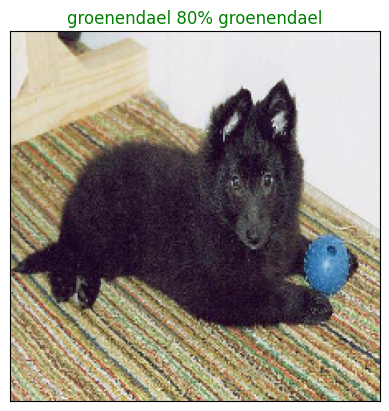

In [62]:
def plot_pred(predictions_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  # Access the elements from the input parameters
  pred_probs, true_label, image = predictions_probabilities[n], labels[n], images[n]

  ## Get the prediction label using the get_pred_label function
  pred_label = get_pred_label(pred_probs)

  ## Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  ## Change the color of the title depending on if the prediction is right or wrong.
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  ## Change plot title to be predicted, probability of prediction with true label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_probs)*100,
                                   true_label),
                                   color=color)

# Call the plot_pred function with the predictions, val_labels, and val_images
plot_pred(predictions_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77) # Example: Display the first prediction

Now that we've got one function to visulaize our model top prediction, let's make another to view our model's top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer.

* Find the prediction using `get_pred_label()`

* Find the Top 10:

  * Prediction probabilities indexes

  * Prediction probabilities values

  * Prediction labels

* Plot the Top 10 prediction probability values and labels, coloring the True label green.

In [63]:
def plot_pred_conf(predictions_probabilities, labels, n=1):
  """
  Plot the Top 10 highest prediction confidences, along with the truth label for sample n.
  """
  pred_probs, true_label = predictions_probabilities[n], labels[n]

  # Get the prediction label
  pred_label = get_pred_label(pred_probs)

  # Find the top 10 prediction confidence indexes.
  top_10_pred_indexes = pred_probs.argsort()[-10:][::-1]
  # Find top 10 prediction confidence values
  top_10_pred_values = pred_probs[top_10_pred_indexes]

  # Find the top prediction labels
  top_10_pred_labels = unique_breed[top_10_pred_indexes]

  # Setup plot.
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="Red")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change color of true lable
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("Green")
  else:
      pass

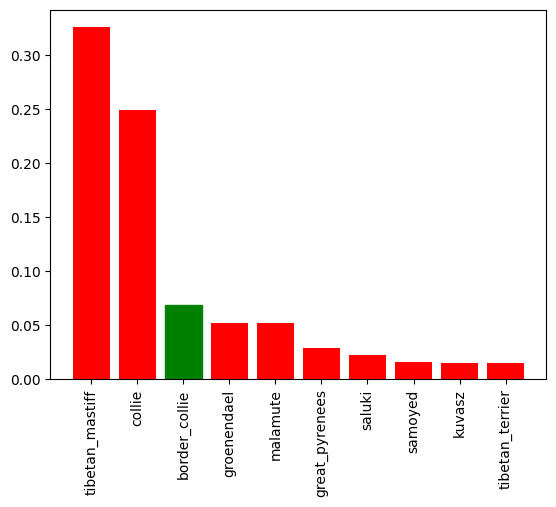

In [64]:
plot_pred_conf(predictions_probabilities=predictions,
               labels=val_labels,
               n=9)

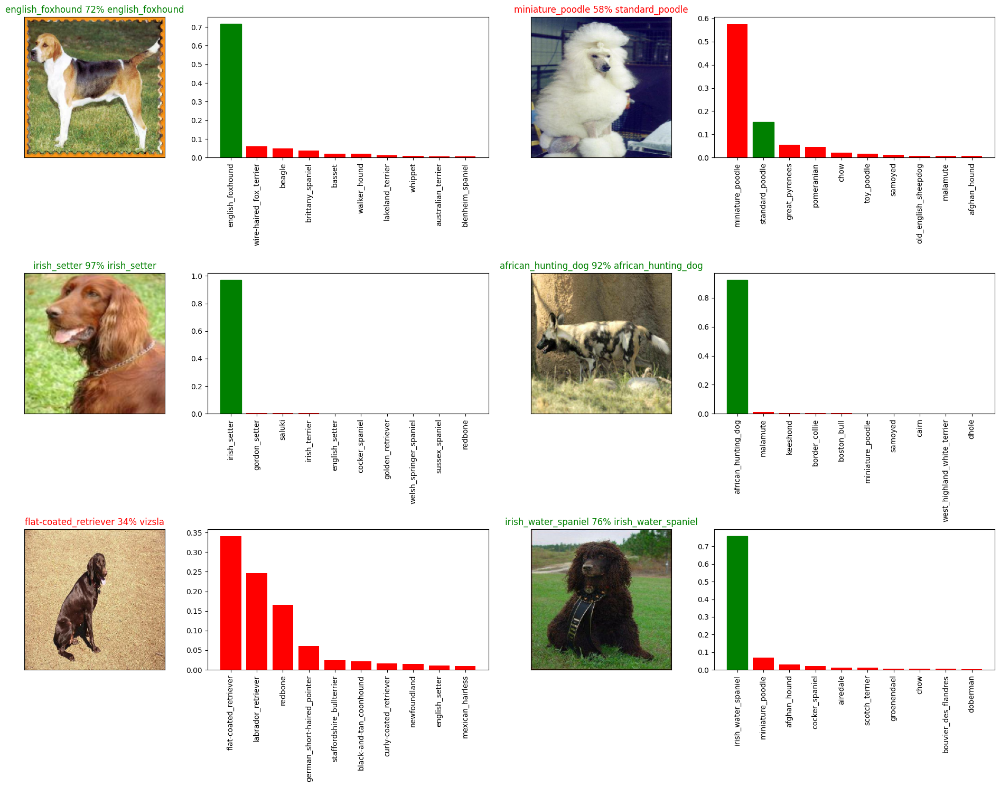

In [65]:
# Let's check out a few predictions and their different values.
i_multiplier = 14
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

CHALLENGE: How would you create a Confusion matrix with our Model Predictions and true labels.


## Saving and Loading a Trained Model

In [66]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string) to the filenmae
  """
  # Create a model directory pathname with current time.
  modeldir_path = os.path.join("drive/MyDrive/Dog Vision/Models",
                             datetime.datetime.now().strftime("%Y%m%d-%H%m%s"))
  model_path = modeldir_path + "_" + suffix + ".h5" # .h5 or HDF5 saves format of a model.
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path

In [67]:
# Create a function to load a Trained Model
def load_model(model_path):
  """
  load a trained model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = keras.models.load_model(model_path,
                                  custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [68]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/Models/20250517-15051747495124_1000-images-mobilenetv2-Adam.h5....


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/Models/20250517-15051747495124_1000-images-mobilenetv2-Adam.h5'

In [69]:
# Load a Trained model.
loaded_1000_images_model = load_model("drive/MyDrive/Dog Vision/Models/20250512-11051747049934_1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/Models/20250512-11051747049934_1000-images-mobilenetv2-Adam.h5


In [70]:
# Evaluate the pre-saved model
model.evaluate(val_data) # This our model before saving it.

7/7 [==============================] - 1s 87ms/step - loss: 1.2466 - accuracy: 0.6750


[1.246575951576233, 0.675000011920929]

In [71]:
## Evaluate the Loaded model
loaded_1000_images_model.evaluate(val_data) # This our model after saving it.

7/7 [==============================] - 1s 92ms/step - loss: 1.2562 - accuracy: 0.6350


[1.2561911344528198, 0.6349999904632568]

## Training a big dog model (on the full data)

In [72]:
# Let's recall our image dataset again .
len(x), len(y) # Y=labels and x=training data.

(10222, 10222)

In [73]:
# Create a data batch with the full dataset
full_data = create_data_batches(x, y)

Creating training data batches...


In [74]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [75]:
# Create a model for full model
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [76]:
# Create a full model callback
full_model_tensorboard = create_tensorboard_callback() # This function helps us to track the performance of our model and compared it to others.
# There's no validation set when training on all the data, so we can't monitor validation accuracy.
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor="accuracy",
                                                          patience=3)

In [77]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[tensorboard,
                          early_stopping])


Epoch 1/100
320/320 [==============================] - ETA: 0s - loss: 1.3371 - accuracy: 0.6696

320/320 [==============================] - 43s 116ms/step - loss: 1.3371 - accuracy: 0.6696
Epoch 2/100
319/320 [============================>.] - ETA: 0s - loss: 0.3977 - accuracy: 0.8837

320/320 [==============================] - 34s 106ms/step - loss: 0.3977 - accuracy: 0.8837
Epoch 3/100
319/320 [============================>.] - ETA: 0s - loss: 0.2358 - accuracy: 0.9368

320/320 [==============================] - 36s 113ms/step - loss: 0.2359 - accuracy: 0.9369
Epoch 4/100
319/320 [============================>.] - ETA: 0s - loss: 0.1528 - accuracy: 0.9648

320/320 [==============================] - 35s 109ms/step - loss: 0.1528 - accuracy: 0.9648
Epoch 5/100
319/320 [============================>.] - ETA: 0s - loss: 0.1061 - accuracy: 0.9790

320/320 [==============================] - 35s 110ms/step - loss: 0.1061 - accuracy: 0.9791
Epoch 6/100
319/320 [============================>.] - ETA: 0s - loss: 0.0784 - accuracy: 0.9863

320/320 [==============================] - 34s 107ms/step - loss: 0.0784 - accuracy: 0.9863
Epoch 7/100
319/320 [============================>.] - ETA: 0s - loss: 0.0580 - accuracy: 0.9918

320/320 [==============================] - 35s 109ms/step - loss: 0.0581 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - ETA: 0s - loss: 0.0463 - accuracy: 0.9934

320/320 [==============================] - 36s 111ms/step - loss: 0.0463 - accuracy: 0.9934
Epoch 9/100
319/320 [============================>.] - ETA: 0s - loss: 0.0379 - accuracy: 0.9955

320/320 [==============================] - 36s 114ms/step - loss: 0.0379 - accuracy: 0.9955
Epoch 10/100
319/320 [============================>.] - ETA: 0s - loss: 0.0303 - accuracy: 0.9978

320/320 [==============================] - 36s 112ms/step - loss: 0.0303 - accuracy: 0.9978
Epoch 11/100
319/320 [============================>.] - ETA: 0s - loss: 0.0259 - accuracy: 0.9979

320/320 [==============================] - 36s 113ms/step - loss: 0.0259 - accuracy: 0.9979
Epoch 12/100
319/320 [============================>.] - ETA: 0s - loss: 0.0243 - accuracy: 0.9978

320/320 [==============================] - 39s 120ms/step - loss: 0.0243 - accuracy: 0.9978
Epoch 13/100
319/320 [============================>.] - ETA: 0s - loss: 0.0195 - accuracy: 0.9987

320/320 [==============================] - 35s 110ms/step - loss: 0.0195 - accuracy: 0.9987
Epoch 14/100
319/320 [============================>.] - ETA: 0s - loss: 0.0184 - accuracy: 0.9983

320/320 [==============================] - 37s 115ms/step - loss: 0.0184 - accuracy: 0.9983
Epoch 15/100
319/320 [============================>.] - ETA: 0s - loss: 0.0146 - accuracy: 0.9988

320/320 [==============================] - 38s 119ms/step - loss: 0.0146 - accuracy: 0.9988
Epoch 16/100
319/320 [============================>.] - ETA: 0s - loss: 0.0153 - accuracy: 0.9982

320/320 [==============================] - 39s 123ms/step - loss: 0.0153 - accuracy: 0.9982
Epoch 17/100
319/320 [============================>.] - ETA: 0s - loss: 0.0121 - accuracy: 0.9987

320/320 [==============================] - 39s 122ms/step - loss: 0.0121 - accuracy: 0.9987
Epoch 18/100
319/320 [============================>.] - ETA: 0s - loss: 0.0132 - accuracy: 0.9983

320/320 [==============================] - 38s 118ms/step - loss: 0.0131 - accuracy: 0.9983
Epoch 19/100
319/320 [============================>.] - ETA: 0s - loss: 0.0105 - accuracy: 0.9991

320/320 [==============================] - 37s 117ms/step - loss: 0.0105 - accuracy: 0.9991
Epoch 20/100
320/320 [==============================] - ETA: 0s - loss: 0.0096 - accuracy: 0.9989

320/320 [==============================] - 35s 110ms/step - loss: 0.0096 - accuracy: 0.9989
Epoch 21/100
319/320 [============================>.] - ETA: 0s - loss: 0.0099 - accuracy: 0.9990

320/320 [==============================] - 36s 113ms/step - loss: 0.0099 - accuracy: 0.9990
Epoch 22/100
320/320 [==============================] - ETA: 0s - loss: 0.0101 - accuracy: 0.9987

320/320 [==============================] - 36s 111ms/step - loss: 0.0101 - accuracy: 0.9987
Epoch 23/100
319/320 [============================>.] - ETA: 0s - loss: 0.0092 - accuracy: 0.9988

320/320 [==============================] - 36s 112ms/step - loss: 0.0092 - accuracy: 0.9988
Epoch 24/100
319/320 [============================>.] - ETA: 0s - loss: 0.0146 - accuracy: 0.9978

320/320 [==============================] - 36s 111ms/step - loss: 0.0146 - accuracy: 0.9978
Epoch 25/100
319/320 [============================>.] - ETA: 0s - loss: 0.0335 - accuracy: 0.9907

320/320 [==============================] - 35s 109ms/step - loss: 0.0336 - accuracy: 0.9906
Epoch 26/100
319/320 [============================>.] - ETA: 0s - loss: 0.0455 - accuracy: 0.9863

320/320 [==============================] - 35s 108ms/step - loss: 0.0455 - accuracy: 0.9863
Epoch 27/100
319/320 [============================>.] - ETA: 0s - loss: 0.0175 - accuracy: 0.9964

320/320 [==============================] - 36s 112ms/step - loss: 0.0175 - accuracy: 0.9964
Epoch 28/100
319/320 [============================>.] - ETA: 0s - loss: 0.0110 - accuracy: 0.9985

320/320 [==============================] - 35s 108ms/step - loss: 0.0110 - accuracy: 0.9985
Epoch 29/100
319/320 [============================>.] - ETA: 0s - loss: 0.0087 - accuracy: 0.9987

320/320 [==============================] - 34s 107ms/step - loss: 0.0087 - accuracy: 0.9987
Epoch 30/100
319/320 [============================>.] - ETA: 0s - loss: 0.0060 - accuracy: 0.9992

320/320 [==============================] - 36s 112ms/step - loss: 0.0060 - accuracy: 0.9992
Epoch 31/100
319/320 [============================>.] - ETA: 0s - loss: 0.0079 - accuracy: 0.9989

320/320 [==============================] - 36s 112ms/step - loss: 0.0079 - accuracy: 0.9989
Epoch 32/100
319/320 [============================>.] - ETA: 0s - loss: 0.0060 - accuracy: 0.9993

320/320 [==============================] - 36s 111ms/step - loss: 0.0060 - accuracy: 0.9993
Epoch 33/100
319/320 [============================>.] - ETA: 0s - loss: 0.0049 - accuracy: 0.9995

320/320 [==============================] - 36s 112ms/step - loss: 0.0048 - accuracy: 0.9995
Epoch 34/100
319/320 [============================>.] - ETA: 0s - loss: 0.0073 - accuracy: 0.9991

320/320 [==============================] - 36s 111ms/step - loss: 0.0073 - accuracy: 0.9991
Epoch 35/100
319/320 [============================>.] - ETA: 0s - loss: 0.0077 - accuracy: 0.9990

320/320 [==============================] - 34s 106ms/step - loss: 0.0077 - accuracy: 0.9990
Epoch 36/100
319/320 [============================>.] - ETA: 0s - loss: 0.0080 - accuracy: 0.9990

320/320 [==============================] - 36s 111ms/step - loss: 0.0080 - accuracy: 0.9990
Epoch 37/100
319/320 [============================>.] - ETA: 0s - loss: 0.0069 - accuracy: 0.9990

320/320 [==============================] - 36s 111ms/step - loss: 0.0069 - accuracy: 0.9990
Epoch 38/100
319/320 [============================>.] - ETA: 0s - loss: 0.0074 - accuracy: 0.9991

320/320 [==============================] - 36s 112ms/step - loss: 0.0074 - accuracy: 0.9991
Epoch 39/100
320/320 [==============================] - ETA: 0s - loss: 0.0075 - accuracy: 0.9989

320/320 [==============================] - 36s 112ms/step - loss: 0.0075 - accuracy: 0.9989
Epoch 40/100
319/320 [============================>.] - ETA: 0s - loss: 0.0080 - accuracy: 0.9987

320/320 [==============================] - 36s 111ms/step - loss: 0.0080 - accuracy: 0.9987
Epoch 41/100
319/320 [============================>.] - ETA: 0s - loss: 0.0064 - accuracy: 0.9992

320/320 [==============================] - 36s 111ms/step - loss: 0.0064 - accuracy: 0.9992
Epoch 42/100
319/320 [============================>.] - ETA: 0s - loss: 0.0115 - accuracy: 0.9974

320/320 [==============================] - 36s 112ms/step - loss: 0.0115 - accuracy: 0.9974
Epoch 43/100
319/320 [============================>.] - ETA: 0s - loss: 0.0072 - accuracy: 0.9989

320/320 [==============================] - 34s 107ms/step - loss: 0.0072 - accuracy: 0.9989
Epoch 44/100
319/320 [============================>.] - ETA: 0s - loss: 0.0072 - accuracy: 0.9991

320/320 [==============================] - 36s 112ms/step - loss: 0.0072 - accuracy: 0.9991
Epoch 45/100
319/320 [============================>.] - ETA: 0s - loss: 0.0069 - accuracy: 0.9991

320/320 [==============================] - 37s 116ms/step - loss: 0.0069 - accuracy: 0.9991
Epoch 46/100
319/320 [============================>.] - ETA: 0s - loss: 0.0058 - accuracy: 0.9991

320/320 [==============================] - 36s 113ms/step - loss: 0.0058 - accuracy: 0.9991
Epoch 47/100
320/320 [==============================] - ETA: 0s - loss: 0.0072 - accuracy: 0.9991

320/320 [==============================] - 34s 107ms/step - loss: 0.0072 - accuracy: 0.9991
Epoch 48/100
320/320 [==============================] - ETA: 0s - loss: 0.0085 - accuracy: 0.9987

320/320 [==============================] - 36s 112ms/step - loss: 0.0085 - accuracy: 0.9987
Epoch 49/100
319/320 [============================>.] - ETA: 0s - loss: 0.0075 - accuracy: 0.9986

320/320 [==============================] - 36s 112ms/step - loss: 0.0075 - accuracy: 0.9986
Epoch 50/100
319/320 [============================>.] - ETA: 0s - loss: 0.0276 - accuracy: 0.9930

320/320 [==============================] - 35s 110ms/step - loss: 0.0276 - accuracy: 0.9931
Epoch 51/100
320/320 [==============================] - ETA: 0s - loss: 0.0237 - accuracy: 0.9930

320/320 [==============================] - 35s 109ms/step - loss: 0.0237 - accuracy: 0.9930
Epoch 52/100
319/320 [============================>.] - ETA: 0s - loss: 0.0121 - accuracy: 0.9976

320/320 [==============================] - 37s 115ms/step - loss: 0.0121 - accuracy: 0.9977
Epoch 53/100
320/320 [==============================] - ETA: 0s - loss: 0.0080 - accuracy: 0.9989

320/320 [==============================] - 36s 114ms/step - loss: 0.0080 - accuracy: 0.9989
Epoch 54/100
319/320 [============================>.] - ETA: 0s - loss: 0.0058 - accuracy: 0.9992

320/320 [==============================] - 36s 113ms/step - loss: 0.0067 - accuracy: 0.9991
Epoch 55/100
319/320 [============================>.] - ETA: 0s - loss: 0.0062 - accuracy: 0.9991

320/320 [==============================] - 36s 112ms/step - loss: 0.0061 - accuracy: 0.9991
Epoch 56/100
319/320 [============================>.] - ETA: 0s - loss: 0.0074 - accuracy: 0.9990

320/320 [==============================] - 37s 115ms/step - loss: 0.0074 - accuracy: 0.9990
Epoch 57/100
320/320 [==============================] - ETA: 0s - loss: 0.0069 - accuracy: 0.9990

320/320 [==============================] - 36s 113ms/step - loss: 0.0069 - accuracy: 0.9990
Epoch 58/100
319/320 [============================>.] - ETA: 0s - loss: 0.0081 - accuracy: 0.9989

320/320 [==============================] - 36s 113ms/step - loss: 0.0081 - accuracy: 0.9989
Epoch 59/100
319/320 [============================>.] - ETA: 0s - loss: 0.0069 - accuracy: 0.9991

320/320 [==============================] - 35s 110ms/step - loss: 0.0069 - accuracy: 0.9991
Epoch 60/100
319/320 [============================>.] - ETA: 0s - loss: 0.0061 - accuracy: 0.9991

320/320 [==============================] - 36s 111ms/step - loss: 0.0061 - accuracy: 0.9991
Epoch 61/100
320/320 [==============================] - ETA: 0s - loss: 0.0071 - accuracy: 0.9991

320/320 [==============================] - 36s 113ms/step - loss: 0.0071 - accuracy: 0.9991
Epoch 62/100
319/320 [============================>.] - ETA: 0s - loss: 0.0055 - accuracy: 0.9993

320/320 [==============================] - 36s 114ms/step - loss: 0.0055 - accuracy: 0.9993
Epoch 63/100
319/320 [============================>.] - ETA: 0s - loss: 0.0073 - accuracy: 0.9991

320/320 [==============================] - 36s 112ms/step - loss: 0.0072 - accuracy: 0.9991
Epoch 64/100
320/320 [==============================] - ETA: 0s - loss: 0.0059 - accuracy: 0.9992

320/320 [==============================] - 36s 113ms/step - loss: 0.0059 - accuracy: 0.9992
Epoch 65/100
319/320 [============================>.] - ETA: 0s - loss: 0.0054 - accuracy: 0.9991

320/320 [==============================] - 36s 111ms/step - loss: 0.0055 - accuracy: 0.9991
Epoch 66/100
319/320 [============================>.] - ETA: 0s - loss: 0.0074 - accuracy: 0.9991

320/320 [==============================] - 36s 114ms/step - loss: 0.0074 - accuracy: 0.9991
Epoch 67/100
319/320 [============================>.] - ETA: 0s - loss: 0.0061 - accuracy: 0.9992

320/320 [==============================] - 36s 111ms/step - loss: 0.0061 - accuracy: 0.9992
Epoch 68/100
320/320 [==============================] - ETA: 0s - loss: 0.0053 - accuracy: 0.9992

320/320 [==============================] - 35s 108ms/step - loss: 0.0053 - accuracy: 0.9992
Epoch 69/100
319/320 [============================>.] - ETA: 0s - loss: 0.0078 - accuracy: 0.9991

320/320 [==============================] - 37s 114ms/step - loss: 0.0078 - accuracy: 0.9991
Epoch 70/100
319/320 [============================>.] - ETA: 0s - loss: 0.0075 - accuracy: 0.9990

320/320 [==============================] - 36s 111ms/step - loss: 0.0074 - accuracy: 0.9990
Epoch 71/100
319/320 [============================>.] - ETA: 0s - loss: 0.0042 - accuracy: 0.9994

320/320 [==============================] - 37s 115ms/step - loss: 0.0042 - accuracy: 0.9994
Epoch 72/100
319/320 [============================>.] - ETA: 0s - loss: 0.0060 - accuracy: 0.9993

320/320 [==============================] - 37s 114ms/step - loss: 0.0059 - accuracy: 0.9993
Epoch 73/100
319/320 [============================>.] - ETA: 0s - loss: 0.0087 - accuracy: 0.9989

320/320 [==============================] - 36s 111ms/step - loss: 0.0087 - accuracy: 0.9989
Epoch 74/100
319/320 [============================>.] - ETA: 0s - loss: 0.0074 - accuracy: 0.9991

320/320 [==============================] - 36s 112ms/step - loss: 0.0074 - accuracy: 0.9991
Epoch 75/100
319/320 [============================>.] - ETA: 0s - loss: 0.0084 - accuracy: 0.9984

320/320 [==============================] - 36s 111ms/step - loss: 0.0084 - accuracy: 0.9984
Epoch 76/100
319/320 [============================>.] - ETA: 0s - loss: 0.0067 - accuracy: 0.9990

320/320 [==============================] - 35s 108ms/step - loss: 0.0067 - accuracy: 0.9990
Epoch 77/100
320/320 [==============================] - ETA: 0s - loss: 0.0079 - accuracy: 0.9989

320/320 [==============================] - 36s 113ms/step - loss: 0.0079 - accuracy: 0.9989
Epoch 78/100
320/320 [==============================] - ETA: 0s - loss: 0.0079 - accuracy: 0.9987

320/320 [==============================] - 36s 112ms/step - loss: 0.0079 - accuracy: 0.9987
Epoch 79/100
319/320 [============================>.] - ETA: 0s - loss: 0.0077 - accuracy: 0.9989

320/320 [==============================] - 35s 109ms/step - loss: 0.0077 - accuracy: 0.9989
Epoch 80/100
320/320 [==============================] - ETA: 0s - loss: 0.0124 - accuracy: 0.9974

320/320 [==============================] - 35s 110ms/step - loss: 0.0124 - accuracy: 0.9974
Epoch 81/100
319/320 [============================>.] - ETA: 0s - loss: 0.0131 - accuracy: 0.9972

320/320 [==============================] - 36s 113ms/step - loss: 0.0131 - accuracy: 0.9972
Epoch 82/100
319/320 [============================>.] - ETA: 0s - loss: 0.0104 - accuracy: 0.9979

320/320 [==============================] - 36s 113ms/step - loss: 0.0103 - accuracy: 0.9979
Epoch 83/100
319/320 [============================>.] - ETA: 0s - loss: 0.0094 - accuracy: 0.9983

320/320 [==============================] - 40s 125ms/step - loss: 0.0094 - accuracy: 0.9983
Epoch 84/100
319/320 [============================>.] - ETA: 0s - loss: 0.0063 - accuracy: 0.9992

320/320 [==============================] - 40s 124ms/step - loss: 0.0063 - accuracy: 0.9992
Epoch 85/100
319/320 [============================>.] - ETA: 0s - loss: 0.0069 - accuracy: 0.9991

320/320 [==============================] - 39s 121ms/step - loss: 0.0069 - accuracy: 0.9991
Epoch 86/100
319/320 [============================>.] - ETA: 0s - loss: 0.0051 - accuracy: 0.9993

320/320 [==============================] - 39s 121ms/step - loss: 0.0051 - accuracy: 0.9993
Epoch 87/100
319/320 [============================>.] - ETA: 0s - loss: 0.0076 - accuracy: 0.9990

320/320 [==============================] - 37s 117ms/step - loss: 0.0076 - accuracy: 0.9990
Epoch 88/100
319/320 [============================>.] - ETA: 0s - loss: 0.0072 - accuracy: 0.9991

320/320 [==============================] - 38s 118ms/step - loss: 0.0072 - accuracy: 0.9991
Epoch 89/100
320/320 [==============================] - ETA: 0s - loss: 0.0060 - accuracy: 0.9991

320/320 [==============================] - 37s 116ms/step - loss: 0.0060 - accuracy: 0.9991
Epoch 90/100
320/320 [==============================] - ETA: 0s - loss: 0.0064 - accuracy: 0.9992

320/320 [==============================] - 36s 113ms/step - loss: 0.0064 - accuracy: 0.9992
Epoch 91/100
320/320 [==============================] - ETA: 0s - loss: 0.0064 - accuracy: 0.9992

320/320 [==============================] - 36s 111ms/step - loss: 0.0064 - accuracy: 0.9992
Epoch 92/100
319/320 [============================>.] - ETA: 0s - loss: 0.0081 - accuracy: 0.9989

320/320 [==============================] - 37s 114ms/step - loss: 0.0081 - accuracy: 0.9989
Epoch 93/100
319/320 [============================>.] - ETA: 0s - loss: 0.0075 - accuracy: 0.9991

320/320 [==============================] - 37s 114ms/step - loss: 0.0075 - accuracy: 0.9991
Epoch 94/100
319/320 [============================>.] - ETA: 0s - loss: 0.0051 - accuracy: 0.9993

320/320 [==============================] - 37s 115ms/step - loss: 0.0051 - accuracy: 0.9993
Epoch 95/100
320/320 [==============================] - ETA: 0s - loss: 0.0073 - accuracy: 0.9991

320/320 [==============================] - 36s 112ms/step - loss: 0.0073 - accuracy: 0.9991
Epoch 96/100
319/320 [============================>.] - ETA: 0s - loss: 0.0071 - accuracy: 0.9991

320/320 [==============================] - 35s 111ms/step - loss: 0.0071 - accuracy: 0.9991
Epoch 97/100
319/320 [============================>.] - ETA: 0s - loss: 0.0059 - accuracy: 0.9992

320/320 [==============================] - 35s 109ms/step - loss: 0.0059 - accuracy: 0.9992
Epoch 98/100
319/320 [============================>.] - ETA: 0s - loss: 0.0073 - accuracy: 0.9991

320/320 [==============================] - 36s 113ms/step - loss: 0.0073 - accuracy: 0.9991
Epoch 99/100
319/320 [============================>.] - ETA: 0s - loss: 0.0071 - accuracy: 0.9992

320/320 [==============================] - 35s 111ms/step - loss: 0.0071 - accuracy: 0.9992
Epoch 100/100
319/320 [============================>.] - ETA: 0s - loss: 0.0073 - accuracy: 0.9991

320/320 [==============================] - 37s 115ms/step - loss: 0.0073 - accuracy: 0.9991


In [117]:
save_model(full_model, suffix="all-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/Models/20250517-16051747500065_all-images-mobilenetv2-Adam.h5....


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/Models/20250517-16051747500065_all-images-mobilenetv2-Adam.h5'

In [118]:
# Load in the full Model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/Models/20250517-16051747500065_all-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/Models/20250517-16051747500065_all-images-mobilenetv2-Adam.h5


## Making Predictions on test dataset

Since our model has been trained on images in the form of tensor batches, to make predictions on the test data, we have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and covert them into tensor batches.

To make predictions on the test data. We'll:

* Get the test image filenames
* Convert the filename into test data batches using `create_data_batches()` and setting the test_data parameter to True (since the test data doesn't have labels).
*Make a predictions array by passing the test batches to the `predict()` called our model.

In [123]:
import os

# Load test images filenames
test_path = "drive/MyDrive/Dog Vision/test"
test_filenames = [os.path.join(test_path, fname) for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e2e9e37fa587ad87761da12e105c2b6b.jpg',
 'drive/MyDrive/Dog Vision/test/dcccc266ef919edbf3416078edc849db.jpg',
 'drive/MyDrive/Dog Vision/test/dd1101676d8c7fa8522dd5ebd1129d17.jpg',
 'drive/MyDrive/Dog Vision/test/e68da487dabcd11874830a177e8b6218.jpg',
 'drive/MyDrive/Dog Vision/test/e3982348ad8b974cef2298f741bc3c99.jpg',
 'drive/MyDrive/Dog Vision/test/e402619cf0a1766811068db0dd42fbae.jpg',
 'drive/MyDrive/Dog Vision/test/e5e51d0dfc3ccdb74de51933b2671742.jpg',
 'drive/MyDrive/Dog Vision/test/e34bd9a8afc5280b5f2f7489f48c8e7d.jpg',
 'drive/MyDrive/Dog Vision/test/ddbb53bb7ea7060847a0bd4554877e80.jpg',
 'drive/MyDrive/Dog Vision/test/e800b6c8d2904e205d67ada800907762.jpg']

In [110]:
len(test_filenames)

10366

In [124]:
# Create a test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [125]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [126]:
# Make predictions on the test data batch using the laoded full model.
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1926s 6s/step


In [127]:
# Save predictions (numpy array) to csv file (to access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [128]:
# Laod predictions (numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [129]:
## Let's take a look at the 1st 10 test predictions
test_predictions[:10]

array([[5.34902046e-24, 1.62315357e-23, 8.91363914e-25, ...,
        5.18447313e-22, 3.68291793e-26, 7.50501818e-22],
       [1.55859529e-19, 1.22047023e-19, 4.44106365e-24, ...,
        3.44241883e-18, 1.85567283e-17, 4.82449215e-20],
       [1.16776584e-13, 1.68796492e-24, 3.18901805e-22, ...,
        1.14364371e-22, 4.92857675e-22, 1.43922625e-20],
       ...,
       [1.59907318e-22, 4.30317301e-16, 4.51981907e-21, ...,
        9.05043998e-14, 5.41840505e-14, 2.81660504e-16],
       [1.53326134e-20, 1.41058206e-23, 5.39110925e-21, ...,
        1.72022216e-10, 1.19824153e-16, 3.66081511e-20],
       [1.60344528e-17, 9.95697552e-24, 1.29331744e-19, ...,
        3.19098513e-06, 2.06133045e-11, 2.42285176e-20]])

In [130]:
## Let's take a look at the shape
test_predictions.shape

(10366, 120)

## Preparing Test Dataset Predictions for Kaggle

Lokking at the kaggle sample submission, we found out that it want our model prediction probability output in DataFrame with an I.D and a column for each diffrent Dog breed. https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the our data in this format.
We'll:
* Create a pandas DataFrame with an i.d as well as a column for each dog breed.
* Add data to the i.d column by exracting the test image I.D's from their filepaths.
* Add data (prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a csv to submit it to kaggle.

In [132]:
list(unique_breed)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [133]:
import pandas as pd

#Create a Pandas dataframe with Empty column

preds_df = pd.DataFrame(columns=["id"] + list(unique_breed))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [137]:
#Apend test image id's to the prediction dataframe.
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [138]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier,ids
0,e2e9e37fa587ad87761da12e105c2b6b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e2e9e37fa587ad87761da12e105c2b6b
1,dcccc266ef919edbf3416078edc849db,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dcccc266ef919edbf3416078edc849db
2,dd1101676d8c7fa8522dd5ebd1129d17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dd1101676d8c7fa8522dd5ebd1129d17
3,e68da487dabcd11874830a177e8b6218,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e68da487dabcd11874830a177e8b6218
4,e3982348ad8b974cef2298f741bc3c99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e3982348ad8b974cef2298f741bc3c99


In [139]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breed)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier,ids
0,e2e9e37fa587ad87761da12e105c2b6b,5.349020e-24,1.623154e-23,8.913639e-25,3.404941e-22,3.199327e-16,1.566355e-27,6.872795e-29,1.400373e-23,2.249515e-23,...,9.385625e-27,6.858595e-23,2.089067e-22,1.928175e-23,1.571555e-28,3.527801e-28,5.184473e-22,3.682918e-26,7.505018e-22,e2e9e37fa587ad87761da12e105c2b6b
1,dcccc266ef919edbf3416078edc849db,1.558595e-19,1.220470e-19,4.441064e-24,1.454612e-18,2.874750e-15,7.315284e-11,4.237877e-21,1.857831e-19,1.377587e-20,...,5.903668e-23,2.443657e-19,5.955897e-16,2.785410e-23,7.232094e-20,8.120457e-17,3.442419e-18,1.855673e-17,4.824492e-20,dcccc266ef919edbf3416078edc849db
2,dd1101676d8c7fa8522dd5ebd1129d17,1.167766e-13,1.687965e-24,3.189018e-22,1.465624e-15,5.051294e-20,7.112308e-27,3.088213e-23,8.475961e-20,3.163008e-21,...,2.465775e-24,1.475636e-25,2.189226e-18,9.885799e-21,1.125318e-19,5.081680e-26,1.143644e-22,4.928577e-22,1.439226e-20,dd1101676d8c7fa8522dd5ebd1129d17
3,e68da487dabcd11874830a177e8b6218,1.605518e-13,2.421828e-15,1.914011e-16,5.909839e-11,7.627478e-14,2.149796e-11,5.121189e-21,2.503089e-19,1.145484e-16,...,4.062998e-16,2.485772e-18,1.811382e-16,7.097830e-18,2.608179e-14,1.953309e-14,1.790027e-12,1.499027e-09,7.080094e-13,e68da487dabcd11874830a177e8b6218
4,e3982348ad8b974cef2298f741bc3c99,3.304307e-20,3.287528e-16,8.713281e-16,1.238017e-19,5.460190e-15,3.459141e-16,2.320159e-18,2.083661e-13,7.649248e-23,...,7.034136e-13,3.223698e-22,5.965223e-11,3.367477e-18,1.557243e-16,6.665764e-15,1.464753e-17,2.038908e-15,2.798178e-13,e3982348ad8b974cef2298f741bc3c99


In [140]:
# Let's turn it to csv so as to submit it to kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv", index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepath of our own images
* Turn the filepath into data batches using `create_data_batches()`. And since our custom images won't have labels, we'll set the `test_data()` parameter to true.
* Pass the custom image data batch to our model `predict()` method.
* Covert the prediction output probabilitues to prediction labels.
* Compare the predicted labels to custom images

In [141]:
#Let's get the custom image filepath.. setting it up
custom_path = "drive/MyDrive/Dog Vision/his-dog-photos"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)
if os.path.isfile(os.path.join(custom_path, fname))
  and not fname.startswith('.')]
(custom_path)

'drive/MyDrive/Dog Vision/his-dog-photos'

In [148]:
#Let's get the custom image filepath.. setting it up
custom_path = "drive/MyDrive/Dog Vision/his-dog-photos"
custom_image_paths = [custom_path + "/" + fname for fname in os.listdir(custom_path)
if os.path.isfile(os.path.join(custom_path, fname))
  and not fname.startswith('.')]
print(custom_path) # Use print() instead of just (custom_path)

drive/MyDrive/Dog Vision/his-dog-photos


In [149]:
custom_image_paths

['drive/MyDrive/Dog Vision/his-dog-photos/panda.png',
 'drive/MyDrive/Dog Vision/his-dog-photos/dog-photo.png']

In [150]:
#Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [151]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [152]:
custom_preds.shape

(2, 120)

In [153]:
# Get custom image prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['bedlington_terrier', 'golden_retriever']

In [154]:
# Get custom images our unbachify() function won't work siuce there aren't labels
custom_images =[]

# Loop through unbached data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

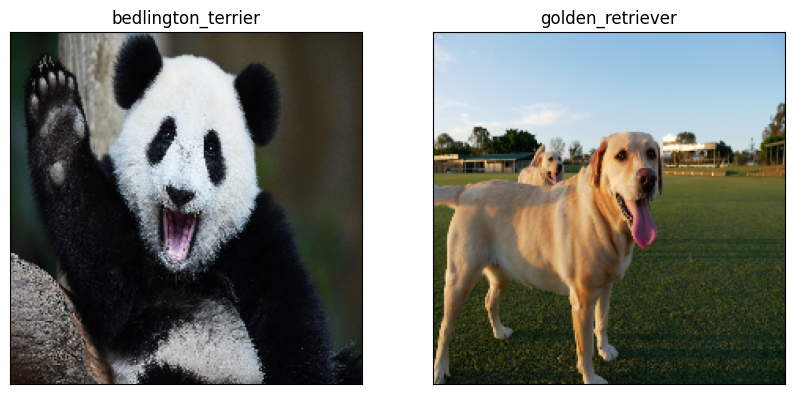

In [156]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 2, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)